# 🧩 Image Segmentation: Dividing the World into Pixels of Interest

Image segmentation is all about labeling pixels to distinguish objects of interest 🕵️‍♂️ from their background. Whether it's coins on a table 💰 or planets in the night sky 🌌, segmentation helps us break an image into meaningful parts. Let’s take a journey through some powerful segmentation techniques with a quirky engineering twist!


## 🪙 Coin Segmentation Challenge: When Backgrounds Play Tricks

We’ll start by segmenting coins 🪙 from a dark background using the `skimage.data.coins` image.

Here’s the initial image:


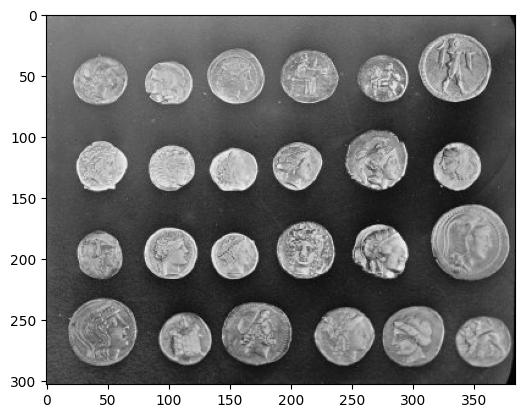

In [1]:
import skimage as ski
import matplotlib.pyplot as plt

coins = ski.data.coins()

plt.imshow(coins, cmap="gray")



At first glance, this seems easy—just pick out the bright pixels for coins, right? Not so fast! The background shares some similar gray levels with the coins. A simple threshold won’t cut it! Let’s see why:


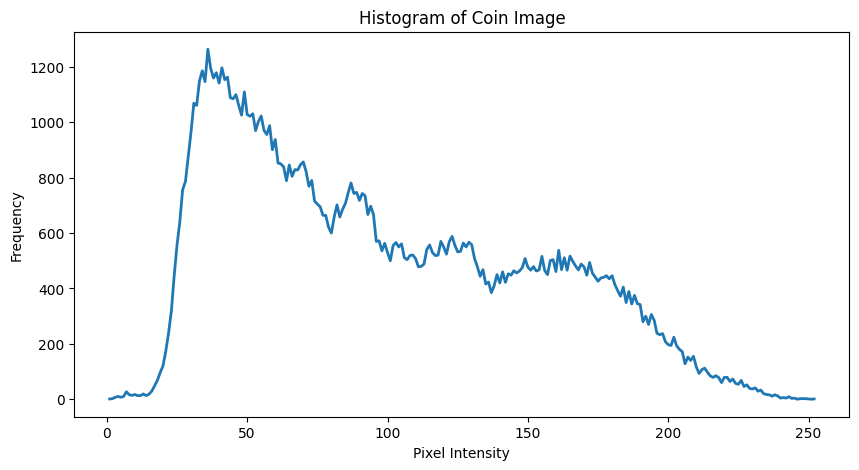

In [9]:
from skimage.exposure import histogram

hist, hist_centers = ski.exposure.histogram(coins)
plt.figure(figsize=(10, 5))
plt.plot(hist_centers, hist, lw=2)
plt.title("Histogram of Coin Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

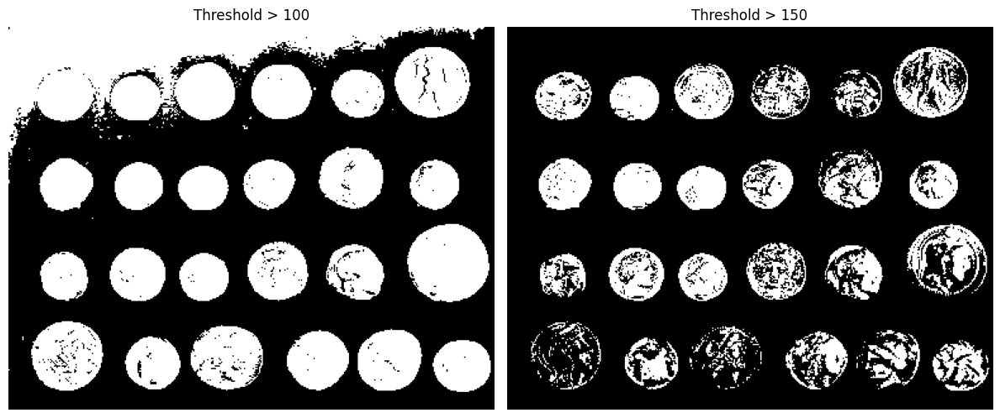

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(coins > 100, cmap="gray")
axes[0].set_title("Threshold > 100")

axes[1].imshow(coins > 150, cmap="gray")
axes[1].set_title("Threshold > 150")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

### 📈 Why Simple Thresholding Fails

Thresholding assumes clear boundaries between objects (coins) and the background. But due to uneven lighting, it either misses parts of the coins or merges the background into them. Not great for an engineer designing a coin-sorting machine! ⚙️💵


### 🗡️ Edge-Based Segmentation: Sharpening the Boundaries

Let’s try detecting edges around the coins using the Canny edge detector. This method finds sharp intensity changes (edges) in the image:


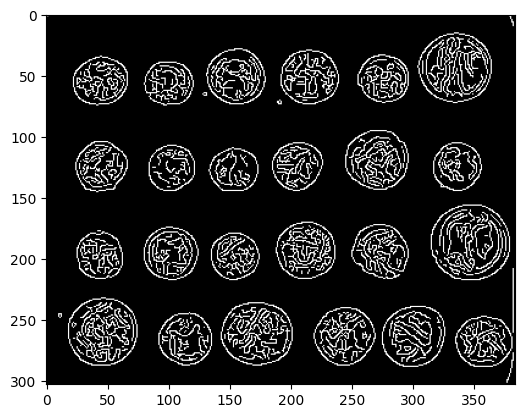

In [11]:
edges = ski.feature.canny(coins / 255.0)

plt.imshow(edges, cmap="gray")

```{tip} 
Engineers often use edge detection to analyze cracks in airplane wings ✈️ or leaks in oil pipelines 🛢️.
```

Once edges are detected, we fill the coin interiors using `binary_fill_holes`:


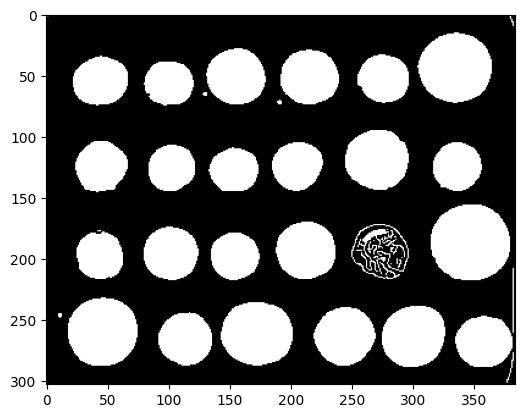

In [12]:
import scipy as sp

fill_coins = sp.ndimage.binary_fill_holes(edges)

plt.imshow(fill_coins, cmap="gray")


🎉 Result: Most coins are segmented, but one stubborn coin didn’t make the cut. Why? The contour wasn’t fully closed. This method is sensitive to gaps in edges. 😕


### 🧼 Cleaning Up Small Artifacts

Background noise can be removed using `ndi.label`, which identifies connected components and filters out small ones:


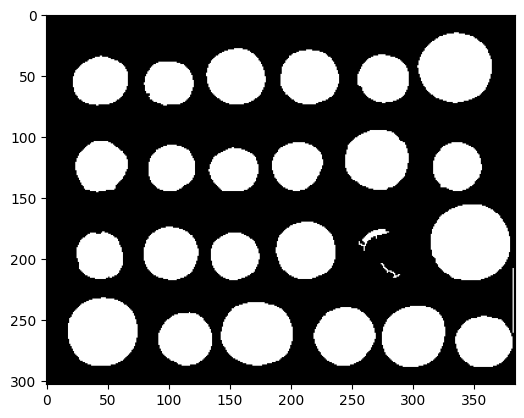

In [13]:
import numpy as np

label_objects, nb_labels = sp.ndimage.label(fill_coins)
sizes = np.bincount(label_objects.ravel())
mask_sizes = sizes > 20
mask_sizes[0] = 0
coins_cleaned = mask_sizes[label_objects]

plt.imshow(coins_cleaned, cmap="gray")

### 💦 Region-Based Segmentation: Let’s Flood the Image!

For a more robust approach, we turn to watershed segmentation, inspired by hydrology 🌊. Imagine “flooding” the image with water from predefined markers (sources). Watershed lines separate regions, creating well-defined boundaries.


#### Step 1: Define Markers 🏁

Markers are pixels we can confidently label as part of the object (coins) or background. Here, we use extreme intensity values:


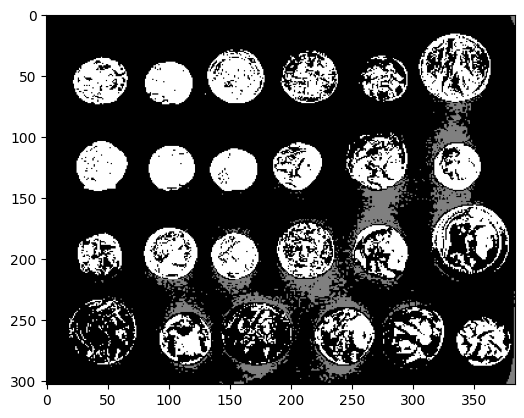

In [14]:
markers = np.zeros_like(coins)
markers[coins < 30] = 1  # Background
markers[coins > 150] = 2  # Coins

plt.imshow(markers, cmap="gray")

#### Step 2: Elevation Map 🌄

We create an elevation map where pixel gradients act as barriers. Higher gradients separate objects from the background:


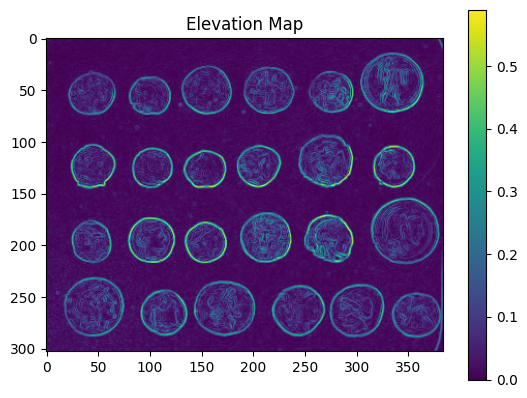

In [15]:
elevation_map = ski.filters.sobel(coins)


plt.imshow(elevation_map, cmap="viridis")
plt.title("Elevation Map")
plt.colorbar()
plt.show()

In [16]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Surface(z=elevation_map)])
fig.update_layout(
    title="3D Elevation Map",
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90),
)
fig.show()

#### Step 3: Apply Watershed Segmentation

Flood the elevation map starting from the markers:


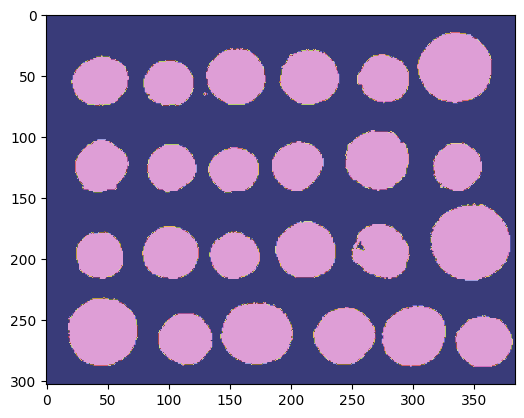

In [17]:
segmentation = ski.segmentation.watershed(elevation_map, markers)

plt.imshow(segmentation, cmap="tab20b")


Now we fill any small holes using `binary_fill_holes`:


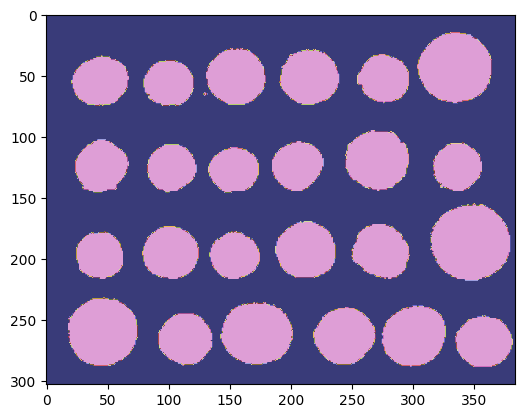

In [18]:
segmentation = sp.ndimage.binary_fill_holes(segmentation - 1)

plt.imshow(segmentation, cmap="tab20b")


Finally, we label each segmented coin:


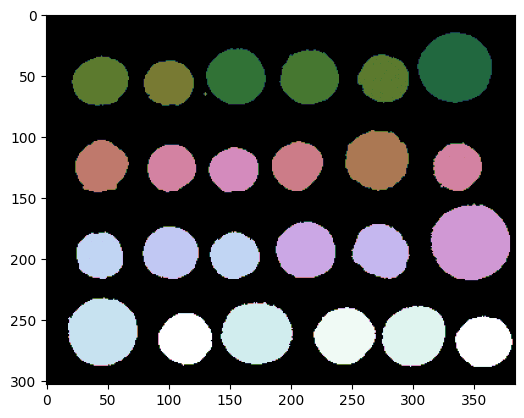

In [20]:
from color_map import discrete_cmap

colormap = discrete_cmap(30, "cubehelix")

labeled_coins, _ = sp.ndimage.label(segmentation)

# need to make the baground -10 to be visible in the colormap
labeled_coins[labeled_coins == 0] = -10

plt.imshow(labeled_coins, cmap=colormap)


🎉 Result: All coins are perfectly segmented! Even with challenging lighting conditions, the watershed transform triumphs. 🏆


## 🧠 Where Does This Work in Real Life?

- Manufacturing: Detecting defects in coins 💰, circuit boards 💻, or mechanical parts ⚙️.
- Medicine: Separating tumors 🩺 from healthy tissue in medical scans.
- Astronomy: Identifying planets 🌍 or stars ✨ in telescope images.

<iframe src="https://numpy.org/case-studies/blackhole-image/" width="800" height="600" frameborder="0" allowfullscreen></iframe>

With these techniques, you can tackle segmentation challenges with confidence. Whether you’re designing a robotic coin sorter 🤖💰 or analyzing biological samples 🧬, scikit-image has your back! You will have the opportunity to work more with scikit-image in your lab.
